<h1>CS166: Assignment 3</h1>
<h2>Network Simulation</h2>

The goal of this assignment is to improve the social dynamics model covered in Session 7.2 on Adaptive Networks. I proposed my own changes to the model to make the dynamics more realistic, implemented my improvements in a simulation, and analyze the expected (theoretical) and actual (experimental) effects of my changes on the model.

<h2>Part 0: The Basic Model</h2>

<h3>Description</h3>

The basic model simulates the interaction between people's preferences or opinions and the strength of their social connections. The basic idea is that social dynamics are driven by two factors:

- People prefer forming social relationships with others who share their preferences, opinions, or interests.

- People's preferences, opinions, or interests tend to become similar to those of other people in their social circle.

These processes are modeled on a small-world network (Watts-Strogatz graph) to observe how both opinions and relationships change over time.

<h4>Nodes</h4>

Nodes represent each person in the network. Each node has an opinion attribute associated with it that can take on a value between 0 and 1. People with similar-value opinions are in agreement on a topic and poeple with different values disagree.

For example, given a node with opinion 0.3, and a different node with opinion 0.8, the nodes will have an opinion difference of |0.3-0.8| = 0.5.

<h4>Edges</h4>

Edges represent the existence of a social relationship between two nodes in the network. Each edge has a weight assigned to it, with a value between 0 to 1. A weight close to 0 signifies a weak relationship between two people, and so their opinions will not influence each other much. A weight close to 1 signifies a strong relationship between two people, and so they will adjust their opinions to be closer to each other.

For example, two nodes with an edge of w = 0.9 between them have a stronger relationship than two nodes with an edge of w = 0.2 between them.

<h3>Update Rules</h3>

There are 3 update rules that dictate the evolution of the network's dynamics:

<h4>Update Rule 1: People change opinions to more closely match those of people they have a strong relationship with.</h4>

<h5>Implementation</h5>

1) Select a random edge from the network, i.e. two people who have an existing social relationship, and let them interact (think of this interaction as having a conversation about the topic on which everyone has an opinion).

2) Update the opinion of each person to move a bit closer together. The stronger their relationship, the more they will move their opinions closer to each other.

<h5>Mathematical Derivation</h5>

The change in opinion of Person $i$ when talking to Person $j$ is:

$\Delta o_i = \alpha w_{ij}(o_j-o_i)$

Person $j$'s opinion also changes, but in the opposite direction to Person $i$'s, thus bringing their opinions closer together. 

<h6>Model Parameters</h6>

$\alpha \in (0,0.5]$ (flexibility level)
- High $\alpha$ indicates high flexibility: people change their opinions to match other people's relatively quickly.
- Low $\alpha$ indicates inflexibility, people change their opinions to match other people's relatively slowly.

<h4>Update Rule 2: People strenghten or weaken their relationships depending on whether they agree or disagree with each other.</h4>

<h5>Implementation</h5>

1) In the same interaction as in Update Rule 1, the weight of the edge connecting nodes $i$ and $j$ is also changed. The update in edge weight symbolizes the strengthening or weakening of the internode relationship depending on how similar or dissimilar their opinions were.

2) If an edge weight drops below 0.05, we remove it from the network. This models a social relationship that has broken down.

<h5>Mathematical Derivation</h5>

The change in weight between Person $i$ and Person $j$:

$\Delta w_{ij} = \beta w_{ij}(1-w_{ij})(1-\gamma |o_i-o_j|)$

<h6>Model Parameters</h6>

$\beta \in (0,1)$ (Relationship rate change)
- High $\beta$ indicates that relationships change drastically in response to a difference in opinion.
- Low $\beta$ indicates that relationships do not change much in response to a difference in opinion

$\gamma > 0$ (Sensitivity to different opinions)
- $\gamma \leq 1$ indicates low sensitivity. All edge weights will converge to 1 over time since different opinions don't matter enough to decrease edge weights.
- $\gamma > 1$ indicates middle to high sensitivity. The edge weight between two nodes will decrease if the opinions of the nodes are different enough, i.e. if $|o_i - o_j| > \gamma^{-1}$.

<h4>Update Rule 3: People have a small probability of randomly making new connections with strangers.</h4>

<h5>Implementation</h5>

1) 1% of the time, we pick two random unconnected nodes from the network and build a new edge between them. The edge weight is initially set to 0.5.

2) Over time, the weight will either increase towards 1 or decrease towards 0 depending on whether the two people have similar or differing opinions using Update Rules 1 and 2.


In [1]:
#import libraries
from IPython.display import display, HTML
from matplotlib import pyplot as plt
import matplotlib as mpl
import networkx as nx
import random
import numpy as np
from scipy import stats
import pandas as pd
import cycler
import seaborn as sns
sns.set()

In [2]:
class SocialDynamicsSim:
    '''
    Simulate social dynamics by strengthening opinions and connection weights
    based on random interactions between nodes.
    '''

    def __init__(self, network_size=50, alpha=0.03, beta=0.3, gamma=4):
        '''
        Inputs:

            network_size (int) The number of nodes in the random Watts-Strogatz
              small-world network. Default: 50.

            alpha (float) The rate at which nodes adjust their opinions to
              match neighboring nodes' opinions during interactions.
              Default: 0.03.

            beta (float) The rate at which edge weights are changed in
              response to differing opinions. Default: 0.3.

            gamma (float) The sensitivity of nodes. Nodes with opinions differing
              by more than 1/gamma will result in an edge weight decreasing.
              Default: 4.
        '''
        self.network_size = network_size
        self.alpha = alpha
        self.beta = beta
        self.gamma = gamma

    def initialize(self):
        '''
        Initialize the simulation with a random graph, with random 0 or 1
        opinions assigned to all nodes and initial edge weights of 0.5.
        '''
        self.graph = nx.watts_strogatz_graph(50, 5, 0.5)
        
        for edge in self.graph.edges:
            self.graph.edges[edge]['weight'] = 0.5
            
        for node in self.graph.nodes:
            self.graph.nodes[node]['opinion'] = random.randint(0, 1)
            
        # Initial visual layout
        self.layout = nx.spring_layout(self.graph)  
        
        # Initial step count
        self.step = 0

    def observe(self):
        '''
        Draw the state of the network.
        '''
        self.layout = nx.spring_layout(self.graph, pos = self.layout, iterations=5)
        plt.clf()
        nx.draw(
                self.graph, pos=self.layout, with_labels=True,
                node_color=[self.graph.nodes[i]['opinion'] for i in self.graph.nodes],
                edge_color=[self.graph.edges[i, j]['weight'] for i, j in self.graph.edges],
                edge_cmap=plt.cm.binary, edge_vmin=0, edge_vmax=1,
                alpha=0.7, vmin=0, vmax=1)
        plt.title('Step: ' + str(self.step))

    def update(self):
        # 1% of the time, create a new edge with weight 0.5 between two unconnected nodes
        if random.uniform(0, 1) < 0.01:
            nodes = list(self.graph.nodes)
            while True:
                new_edge = random.sample(nodes, 2)
                if new_edge not in self.graph.edges:
                    break
            self.graph.add_edge(new_edge[0], new_edge[1], weight=0.5)
        
        else: # Select a random edge and update node opinions and edge weight
            
            #select a random edge
            edge = random.choice(list(self.graph.edges))
            #get edge weight
            weight = self.graph.edges[edge]['weight']
            #get opinions from both nodes on either end of the edge
            opinions = [self.graph.nodes[n]['opinion'] for n in edge]
            
            #update opinions for both nodes
            for i in [0, 1]:
                self.graph.nodes[edge[i]]['opinion'] = (
                    opinions[i] + self.alpha * weight * (opinions[1-i] - opinions[i]))
                
            #update the edge weight
            self.graph.edges[edge]['weight'] = (
                weight +
                self.beta * weight * (1-weight) *
                (1 - self.gamma * abs(opinions[0] - opinions[1])))
            
            # Remove very weak connections
            if self.graph.edges[edge]['weight'] < 0.05:
                self.graph.remove_edge(*edge)
                
        self.step += 1

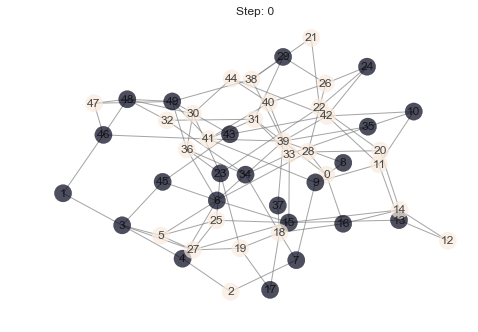

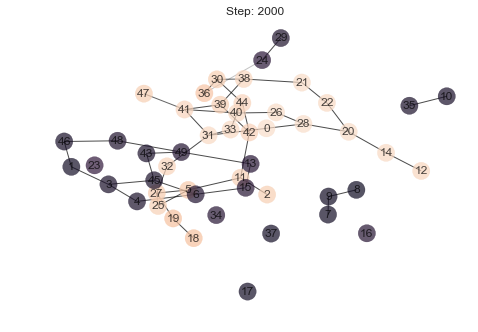

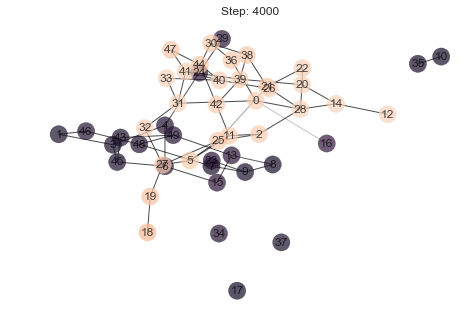

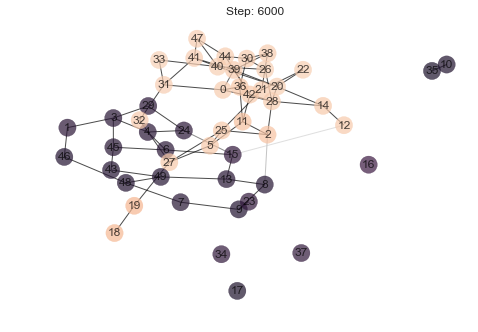

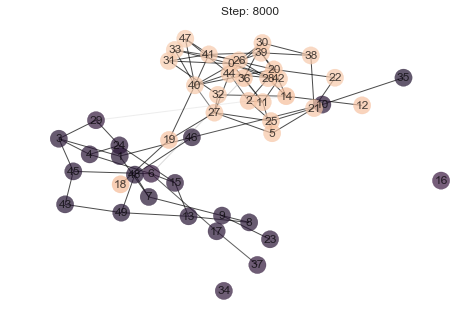

...

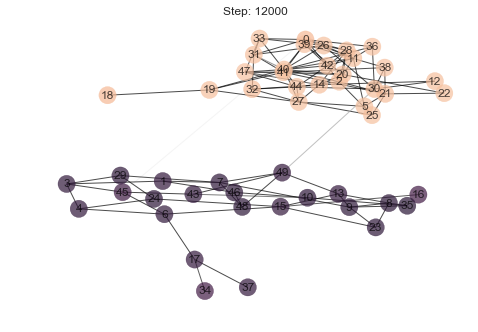

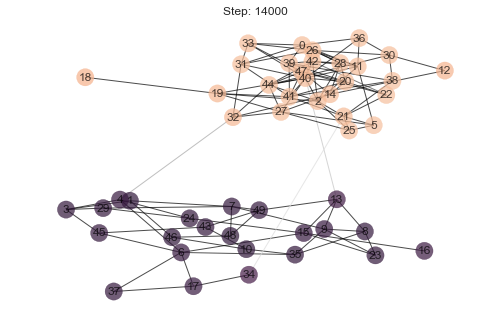

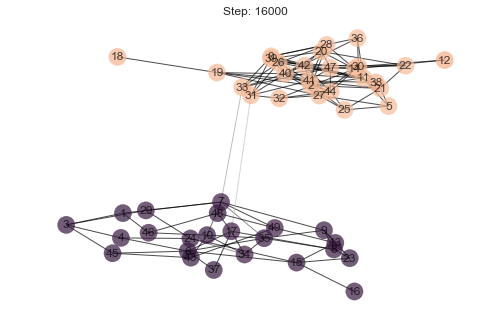

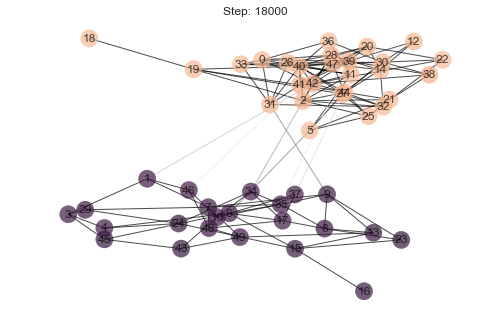

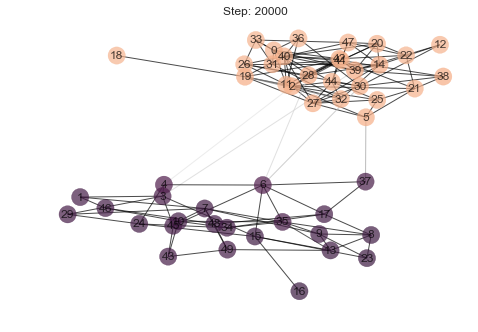

In [3]:
sim = SocialDynamicsSim()

def plot_network(sim):
    sim.initialize()
    plt.figure()
    sim.observe()
    for i in range(10):
        for i in range(2000):
            sim.update()
        plt.figure()
        sim.observe()

plot_network(sim)

<h2>Part 1: Modifications to the Basic Model</h2>

<h3>Multiple Topics</h3>

People can share similar opinions on certain topics while differing on others. Whenever two nodes interact, we randomly choose a topic for them to talk about (randomly select an index from the array of opinions). If they happen to share similar opinions on the chosen topic, then their relationship will be positively affected. If they happen to share dissimilar opinions on the chosen topic, then their relationship will be negatively affected.

<h3>Personalized Parameters</h3>

Given the model parameters:

- $\alpha$: flexibility (controls how easily people change their opinions to match others)
- $\gamma$: sensitivity (controls the threshold of tolerance for a difference in opinions)
- $\beta$: emotional intensity (controls how much the relationship changes in response to differing opinions)

The parameters for each node are personalied by drawing from appropriate normal distributions. This means that different nodes will have differing levels of flexibility, sensitivity, and emotional intensity - though they will not be too different since we are drawing from a normal distribution.


<h3>Model Persuasiveness</h3>

Some people are more charismatic or convincing than others, and can therefore influence opinions and relationship strengths more than others. A persuasiveness parameter is included to observe the effects on the model's dynamics.

<h2>Part 2: Local Analysis</h2>

<h3>General Equations</h3>

<h5>Change in opinions: $\Delta o_i = \alpha w_{ij}(o_j - o_i)$</h5>

From this equation, we see that the bigger the difference in opinion, the greater the change in opinion. As the relationship strength, $w_{ij}$ increases, the change in opinion also increases. As the node flexibility $\alpha$ increases, the change in opinion also increases.

<h5>Change in weight: $\Delta w_{ij} = \beta w_{ij}(1-w_{ij})(1-\gamma |o_i-o_j|)$</h5>

Assuming that the initial edge weight between two nodes is $w_{ij}=0.5$, we can test the resulting change to the edge weight using different values of emotional intensity $\beta$, node sensitivity $\gamma$, and opinion differences, $|o_i - o_j|$:


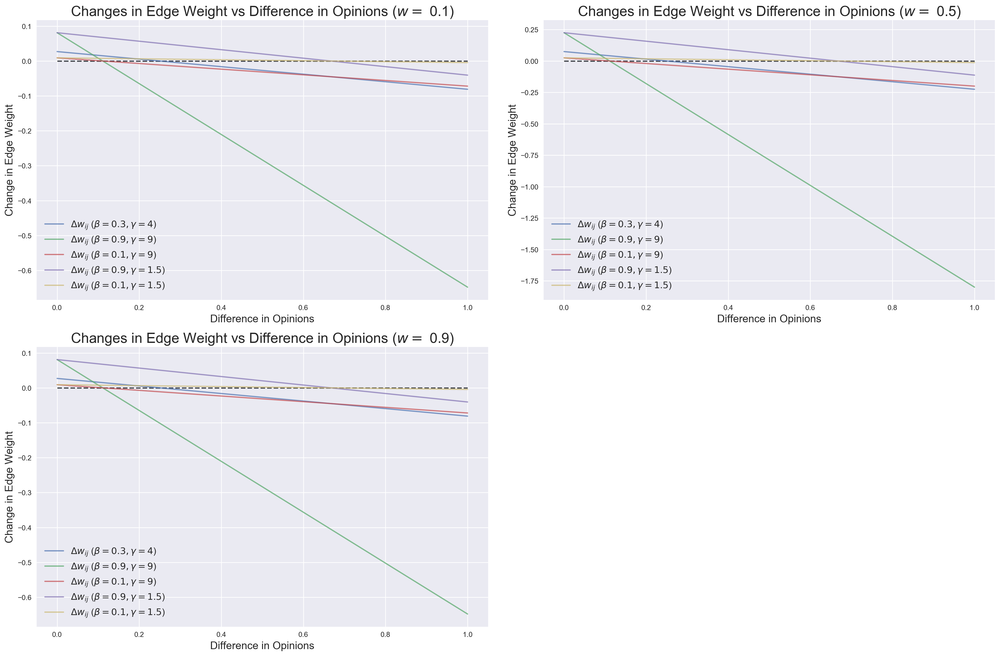

In [4]:

opinion_diff_vals = np.arange(0,1.1,0.1)

def edge_change(w, beta, gamma, diff):
    return beta*w*(1-w)*(1-gamma*abs(diff))

def ec_df(w):

    df = pd.DataFrame({
        '$o_i - o_j$': opinion_diff_vals,
        '$\Delta w_{ij}$ ($\\beta = 0.3, \gamma = 4$)': [edge_change(w,0.3,4,diff) for diff in opinion_diff_vals],
        '$\Delta w_{ij}$ ($\\beta = 0.9, \gamma = 9$)': [edge_change(w,0.9,9,diff) for diff in opinion_diff_vals],
        '$\Delta w_{ij}$ ($\\beta = 0.1, \gamma = 9$)': [edge_change(w,0.1,9,diff) for diff in opinion_diff_vals],
        '$\Delta w_{ij}$ ($\\beta = 0.9, \gamma = 1.5$)': [edge_change(w,0.9,1.5,diff) for diff in opinion_diff_vals],
        '$\Delta w_{ij}$ ($\\beta = 0.1, \gamma = 1.5$)': [edge_change(w,0.1,1.5,diff) for diff in opinion_diff_vals],
    })
    
    return df

def plot_ec(ec_df,w):
    plt.hlines(0, xmin=0, xmax=1, color='#46494f',linestyles='--')
    plt.xlabel("Difference in Opinions", size=15)
    plt.ylabel("Change in Edge Weight", size=15)
    plt.title(f"Changes in Edge Weight vs Difference in Opinions ($w =$ {w})", size=20)
    for i in range(1,len(ec_df.columns)):
        plt.plot(opinion_diff_vals,ec_df.iloc[:,i], label = list(ec_df)[i], alpha=0.7)
    plt.legend(loc='best',prop={'size': 13})

init_edge_weights = [0.1,0.5,0.9]

plt.figure(figsize=(20,13), dpi=200)

for i in range(len(init_edge_weights)):   
    edge_change_df = ec_df(init_edge_weights[i])
    plt.subplot(2,2,i+1)
    plot_ec(edge_change_df,init_edge_weights[i])
plt.tight_layout()


<h3>Interpretation of $\beta$ and $\gamma$</h3>

The graphs above show that irregardless of the starting edge weight, when both $\beta$ and $\gamma$ are high (0.9 and 9 respectively), the change in edge weight has the steepest slope. However, we can also see that the low $\beta =0.1$, high $\gamma =0.9$ line cuts into the $y = 0$ line at roughly the same point - i.e the red and green line both interesect the dotted black line at roughly the same point - which suggests that $\gamma$ has a big effect on the point at which the change in edge weight turns from positive to negative, i.e. $\gamma$ strongly affects the level of opinion difference needed before the interaction between two nodes weakens their relationship instead of strengthening it.

$\beta$ appears to have a magnifying effect - high $\beta$ increases the magnitude of edge weight change, irregardless of whether the change in weight is positive or negative. The purple line ($\beta =0.9, \gamma =0.15$), in contrast to the yellow line ($\beta =0.1, \gamma =0.15$), has a much higher magnitude of positive effect before the difference in opinion becomes great enough to cause the change in edge weight to become negative. Once the purple and yellow lines cross the $y = 0$ dotted line, the negative change in edge weight is also magnified in the purple line vs the yellow line. Since they have similar $\gamma$ values, the purple and yellow lines cross the $y = 0$ boundary at the same time. 

From the graphs' depiction of the change in edge weights over various parameter settings, we can infer that a node with high $\gamma$ will be more sensitive towards a difference in opinion, i.e. experiences a negative change in edge weight even at low differences in opinion, while a node with low $\gamma$ will be less sensitive, and only experiences a negative change in edge weight when opinion difference is very large. When a node has high $\beta$, they experience greater magnitudes of edge weight change, which can be translated to real life as someone who experiences emotions very intensely - whether they be positive or negative emotions. When someone has low $\beta$, the magnitude of positive or negative edge weight change is diminished. In real life, this could be someone who is more stoic in nature.

<h3>Effects of Different Initial Edge Weight $w$</h3>

When $w=0.5$, the rate of edge weight decrease is greater than when $w=0.1$ or $w=0.9$ over the range of all $\beta$ and $\gamma$ values tested. This suggests that individuals, aka the nodes, experience greater relationship increase or decrease with other nodes that they share an "average" relationship with. On the other hand, when they have stronger or weaker relationship with other nodes, the magnitude of relationship change is smaller. This could be interpreted as stronger or weaker relationships not having much room for change since we either:

a) have an established relationship with the other person that is not that "susceptible" to change, or 

b) do not know the other person enough to change our relationship significantly after an interaction. 

However, if we are starting to get more intimate with someone so that they are no longer acquaintances, but also not yet close friends, then every interaction may have more impact as we try to "test the waters" and see whether we have enough in common so that the relationship is worth investing in.

<h3>Mod 1: Multiple Topics</h3>

Let's assume that all topic opinions are normally distributed with a mean of 0.5 and a standard deviation of 0.2, i.e. most people have average opinions on most topics, but will occasionally have extreme opinions on one or two topics. When two nodes interact, we randomly select a topic from the list of topics available, and 3 possible cases emerge.

<h4>1) Both node $i, n_i$ and node $j, n_j$ have average opinions on the chosen topic, topic a: $t_{i} \approx 0.5$ and $t_{j} \approx 0.5$. </h4>

This will be the most common case since the topic opinions will be normally distributed, with a "average opinion" mean of 0.5. With similar opinions, $o_i \approx o_j$, and so $\Delta o_i = \Delta o_j \approx 0$. 

From the graphs above, we see that different values of $\gamma$ will adjust the "threshold of opinion difference" before the edge weight change goes from positive to negative. The graphs show that given an average value of $\gamma=4$, an opinion difference of about up to ~$0.2$ should be tolerated before the edge weight change starts becoming negative.


<h4>2) One of the nodes has an average opinion on the topic, $t_{ai} \approx 0.5$, while the other node has an extreme opinion on the topic, $t_{aj} \approx 0.9$. </h4>

The probability of this occuring is rarer than case 1, since the extreme opinion node would have to be pulled from the tail ends of the normal distribution. When this case occurs, we expect the edge weight to experience a moderate decrease. Regardless of the parameters chosen, an opinion difference of around $0.2 - 0.6$ leads to a moderate decrease in terms of that node's edge weight change trajectory.


<h4>3) Both nodes have extreme opinions on the topic.</h4>

   - Extreme but similar opinions, $t_{i} = t_{j} \approx 0.9$
   - Extreme but dissimilar opinions, $t_{i} \approx 0.9$ and $t_{j} \approx 0.1$
   
This will be the rarest case, since it relies on both node opinions for the chosen topic being sampled from the tail ends of the normal distribution. When this case does occur, if the topics are extreme but similar, we expect the edge weight to increase due to the small opinion difference. If the topics are dissimilar, we expect the edge weight to strongly decrease. Regardless of the parameters chosen, an opinion difference of $\geq 0.7$ leads to the greatest decrease in terms of that node's edge weight change trajectory.

<h4>Summary</h4>

Since Case 1 will be the most common, while Case 2 and Case 3 are less common, we expect that most nodes will either increase their relationship, or only experience minor decreases in relationship since most of their topics should have an averagely-weighted opinion, given that we are sampling from a normal distribution with mean 0.5 and standard deviation 0.2 for each topic.

<h3>Mod 2: Personalized Parameters</h3>

Let's assume that the $\alpha, \beta,\gamma$ parameters are all sampled from normal distributions for any given node. We can test out the various combinations of parameter values to observe the resulting impact on the node opinion and edge weight.

<h4>Opinion Change</h4>

In the opinion change equation, $\Delta o_i = \alpha w_{ij}(o_j - o_i)$, the three components: $\alpha, w_{ij}, $and$ (o_j - o_i)$, i.e. the node flexibility, relationship strength, and difference in opinions, affect the resulting change in opinion for a given node in a rather linear way, i.e. as $\alpha, w_{ij}, $ or $ (o_j - o_i)$ increases, $\Delta o_i$ increases linearly.

We can observe the resulting change in opinion using different values of $\alpha, w_{ij}, $ and $ (o_j - o_i)$ to model different kinds of relationships in the network:

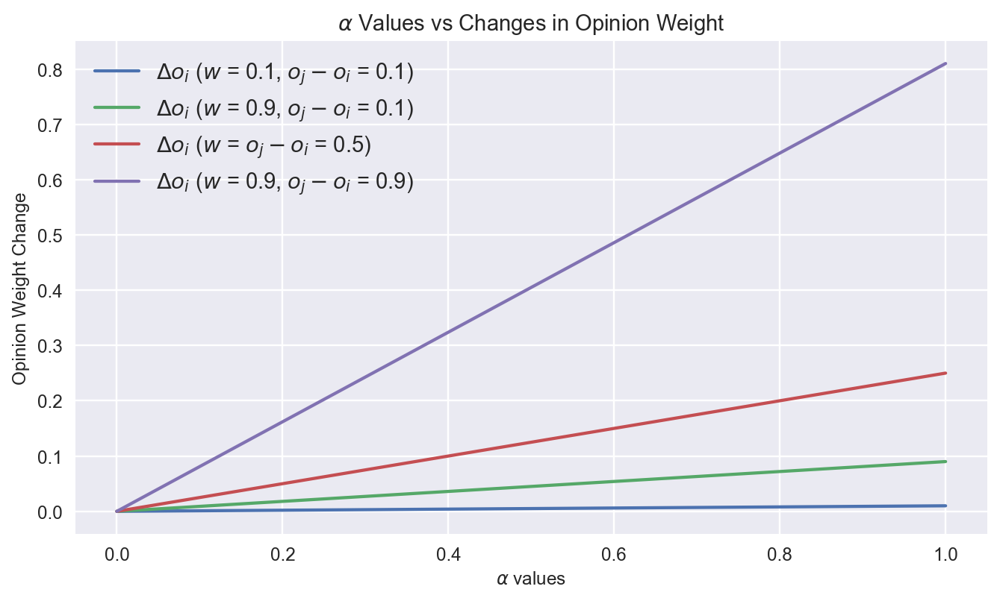

In [5]:
def opinion_change(alpha,w,diff):
    return alpha*w*diff

alpha_vals = np.arange(0,1.1,0.1)
    
def create_oc_df():
    opinion_change_df = pd.DataFrame({

        'Alpha': alpha_vals,

        f'$\Delta o_i$ ($w$ = 0.1, $o_j-o_i$ = 0.1)': #Low weight, small opinion diff
        [opinion_change(a,0.1,0.1) for a in alpha_vals],

        f'$\Delta o_i$ ($w$ = 0.9, $o_j-o_i$ = 0.1)': #High weight, low opinion diff == low weight, high opinion diff
        [opinion_change(a,0.9,0.1) for a in alpha_vals],

        f'$\Delta o_i$ ($w$ = $o_j-o_i$ = 0.5)': #Avg weight, avg opinion diff
        [opinion_change(a,0.5,0.5) for a in alpha_vals],

        f'$\Delta o_i$ ($w$ = 0.9, $o_j-o_i$ = 0.9)': #High weight, high opinion diff
        [opinion_change(a,0.9,0.9) for a in alpha_vals]})
    
    return opinion_change_df

def plot_opinion_change(oc_df):
    plt.xlabel("$\\alpha$ values", size=10)
    plt.ylabel("Opinion Weight Change", size=10)
    plt.title("$\\alpha$ Values vs Changes in Opinion Weight", size=12)
    for i in range(1,len(oc_df.columns)):
        plt.plot(alpha_vals,oc_df.iloc[:,i], label = list(oc_df)[i])
    plt.legend(loc='best',prop={'size': 12})
    plt.show()

plt.figure(figsize=(9,5),dpi=175)
opinion_change_df = create_oc_df()
plot_opinion_change(opinion_change_df)


From the graph above, we see a clear linearly increasing relationship between alpha values and opinion weight change, with the initial combination of high edge weight and big opinion difference having the steepest slope. This makes intuitive sense if we consider that the stronger a relationship is, the more influence the nodes will have on each other; and the more different their opinions are, the more room for change there will be in their respective opinions. On the other hand, if both edge weight and opinion difference are low, then the opinion weight will not change much since the nodes have less influence on each other, and their opinions are too similar to enact opinion change. If edge weight is high but opinion difference is low, we see the same pattern as if edge weight is low but opinion difference is high. This means that a close friend with small opinion difference will change our opinion as much as a distant friend with big opinion difference.

The graph also reveals that at low alpha values, the initial weights and opinion differences do not differ that much in terms of resulting opinion weight change; however, at high alpha values, differing initial conditions can cause vastly different opinion weight changes.

<h4>Relationship Change</h4>

In the relationship change equation, $\Delta w_{ij} = \beta w_{ij}(1-w_{ij})(1-\gamma |o_i-o_j|)$, the main components involved are $\beta, w_{ij},\gamma,$ and $|o_i - o_j|$. From the equation, we can infer that as $\beta$ increases, the edge weight change magnitude increases, whether that be in the positive or negative direction; as $\gamma$ increases, the magnitude of  $|o_i-o_j|$ is inflated, and so $(1-\gamma |o_i-o_j|)$ will be a larger negative number, leading to a larger decrease in edge weight.

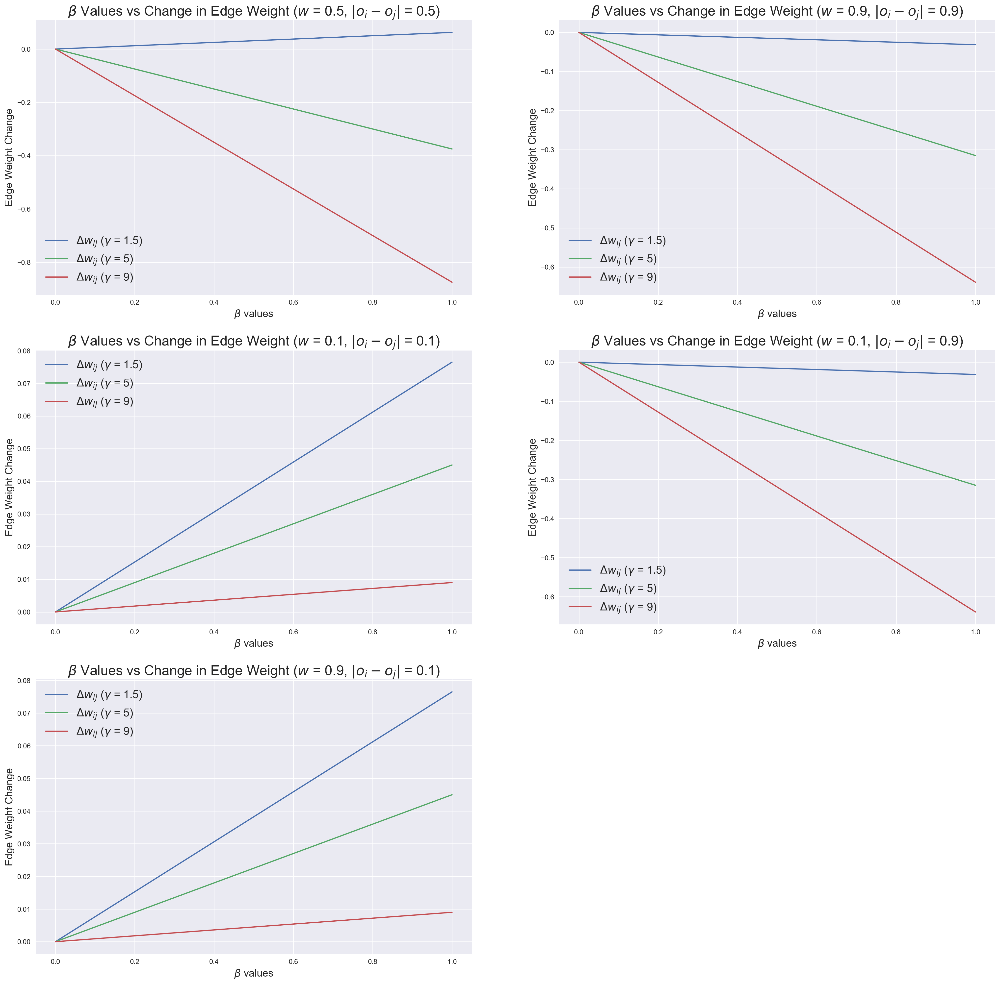

In [6]:
beta_vals = np.arange(0,1.1,0.2)

def edge_change(beta, gamma, w, diff):
    return beta*w*(1-w)*(1-gamma*abs(diff))

def ec_df(w,diff):

    df = pd.DataFrame({
        'Beta': beta_vals,
        '$\Delta w_{ij}$ ($\gamma$ = 1.5)': [edge_change(b,1.5,w,diff) for b in beta_vals],
        '$\Delta w_{ij}$ ($\gamma$ = 5)': [edge_change(b,5,w,diff) for b in beta_vals],
        '$\Delta w_{ij}$ ($\gamma$ = 9)': [edge_change(b,9,w,diff) for b in beta_vals]
    })
    
    return df

param_pairs = [ (0.5,0.5),
                (0.9,0.9),
                (0.1,0.1),
                (0.1,0.9),
                (0.9,0.1) ]

def plot_ec(ec_df,w,diff):
    plt.xlabel("$\\beta$ values", size=15)
    plt.ylabel("Edge Weight Change", size=15)
    plt.title(f"$\\beta$ Values vs Change in Edge Weight ($w$ = {w}, $|o_i - o_j|$ = {diff})", size=20)
    for i in range(1,len(ec_df.columns)):
        plt.plot(beta_vals,ec_df.iloc[:,i], label = list(ec_df)[i])
    plt.legend(loc='best',prop={'size': 16})
    
plt.figure(figsize=(25,25),dpi=200)

for i in range(len(param_pairs)):
    edge_change_df = ec_df(param_pairs[i][0],param_pairs[i][1])
    plt.subplot(3,2,i+1)
    plot_ec(edge_change_df,param_pairs[i][0],param_pairs[i][1])


In comparison to the graphs in the "General Equations" part, here the $\beta$ values are on the x-axis instead of the difference in opinion, and so we see that for some of the graphs with low difference in opinion, the edge weight change is constantly linearly increasing. These graphs emphasize the fact that when the opinion difference is low, i.e. ~0.1, then even if $\gamma$ is high, i.e. the node is sensitive to opinion differences, then the change in edge weight is still positive. 

These graphs also emphasize the phenomenon that when the opinion difference is low (~0.1), the change in edge weight is consistently positive; when opinion difference is high (~0.9), the change in edge weight is consistently negative; but when opinion difference is average (~0.5), then different sensitivities, i.e. different $\gamma$ values, can actually lead to significantly different outcomes - low $\gamma$ leads to an increase in relationship strength, while high $\gamma$ leads to a decrease in relationship strength.

<h4>Summary</h4>

From the analyses and graphs above, we see the effect on the opinions and relationship of two nodes when using different $\alpha,\beta$ and $\gamma$ values. Assuming that we sample the $\alpha,\beta$ and $\gamma$ values from normal distributions of means $0.03,0.3$, and $4$ respectively, with relatively small standard deviations, we can expect that the behavior of the model will not deviate too greatly. Different means and standard deviations can be used in building the normal distributions to observe the evolving behavior of different models. The main purpose of sampling from a normal distribution instead of using fixed values would be to emulate real life behavior where we expect individuals to have different flexibility, emotional intensity, and sensitivity as represented by $\alpha,\beta$ and $\gamma$ respectively. A normal distribution is suitable since we expect most individuals to behave in a rather average way, with a few individuals having more extreme personality traits.

<h3>Mod 3: Model Persuasiveness</h3>

A persuasiveness parameter can be added to the model to represent the different persuasive capabilities that people have. Each node will be assigned a persuasiveness parameter, $\theta$, that will increase the magnitude of opinion change. $\theta \in [0.5,1.5]$. When $\theta = 1$, the model follows its default behavior. $\theta=0.5$ symbolizes poor persuasion ability and $\theta=1.5$ symbolizes high persuasion ability.

As such, the opinion change equation will be changed from $\Delta o_i = \alpha w_{ij}(o_j - o_i)$, to $\Delta o_i = \theta_j\alpha_i w_{ij}(o_j - o_i)$ where $\theta$ will be obtained from the node $j$, while $\alpha$ is obtained from node $i$. 

The effect of $\theta$ is demonstrated over varying levels of $\alpha$ to observe how different flexibility and persuasion levels interact. The weight and opinion difference are fixed at 0.5.

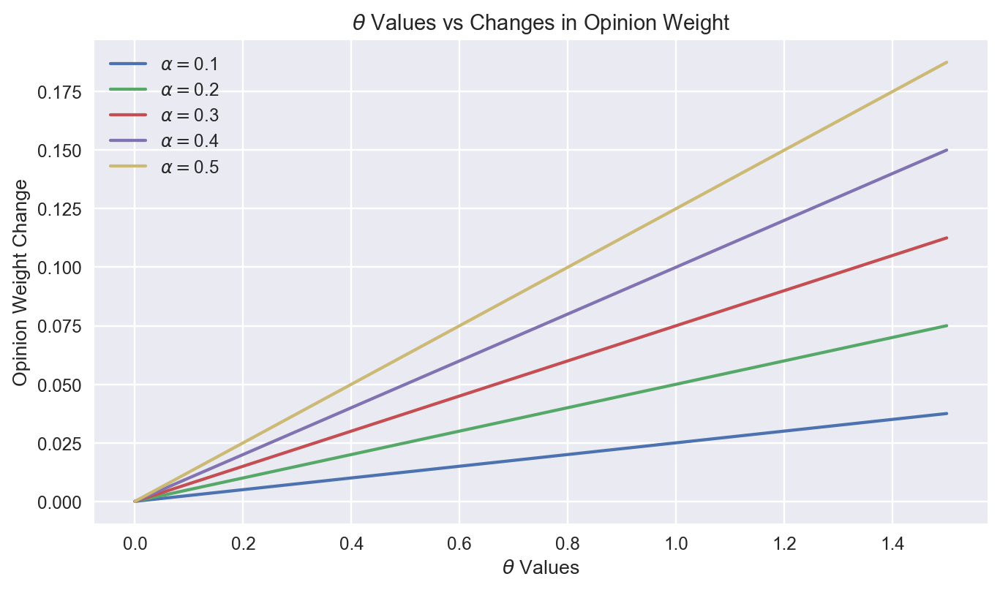

In [7]:
w, diff = 0.5, 0.5

def opinion_change_ext(theta,alpha,w,diff):
    return theta*alpha*w*diff

theta_vals = np.arange(0,1.6,0.1)

alpha_vals = np.arange(0.1,0.6,0.1)

plt.figure(figsize=(9,5),dpi=175)

for i in range(len(alpha_vals)):
    plt.xlabel("$\\theta$ Values")
    plt.ylabel("Opinion Weight Change")
    plt.title("$\\theta$ Values vs Changes in Opinion Weight")
    opinion_change = [opinion_change_ext(t,alpha_vals[i],w,diff) for t in theta_vals]
    plt.plot(theta_vals, opinion_change, label = f"$\\alpha=${round(alpha_vals[i],1)}" )
    plt.legend(loc='best')

<h4>Summary</h4>

As expected, the graph shows that as the level of persuasion, $\theta$, increases, the opinion weight change also increases. Higher levels of $\alpha$ increase the magnitude of opinion weight change for any given value of $\theta$. This suggests that if a node $i$ with high persuasion interacts with a node $j$ with high flexibility, then the expected opinion weight change in node $j$ will be high. On the other hand, low persuasiveness from node $i$ and low flexibility from node $j$ will lead to a low expected opinion weight change.

As with the other parameters, the persuasiveness parameter, $\theta$, of a given node will be sampled from a normal distribution. The default distribution will have a mean of $0.5$ and standard deviation of $0.1$ to represent the average persuasiveness of the general population. This can be adjusted to test out different scenarios.

<h3>Vector Field Plots</h3>

Using a vector field plot, we can observe the convergence or divergence between two nodes over different values of edge weights and opinion weights.

In [8]:
import itertools
import scipy

def vector_plot(alpha,beta,gamma,theta,title_desc='',title_params=''):

    # Plot traces of how opinion and weight change over time
    for opinion, weight in [
        [0.25, 0.95], [0.45, 0.95], [0.55, 0.95], [0.65, 0.95], [0.75, 0.95],
        [0.85, 0.95], [0.95, 0.95], [0.35, 0.65], [0.45, 0.75], [0.95, 0.75],
        [0.95, 0.35], [0.3, 0.25], [0.3, 0.15], [0.15, 0.06], [0.05, 0.06]
    ]:
        ow = [[opinion, 0.0, weight]]
        for i in range(100):
            delta_o = theta * alpha * ow[-1][2] * (ow[-1][1] - ow[-1][0])
            delta_w = (
                beta * ow[-1][2] * (1-ow[-1][2]) *
                (1-gamma*abs(ow[-1][1] - ow[-1][0])))
            new_weight = ow[-1][2] + delta_w
            if new_weight < 0.05:
                new_weight = 0
            ow.append([ow[-1][0] + delta_o, ow[-1][1] - delta_o, new_weight])
        plt.plot(
            [row[0] - row[1] for row in ow],
            [row[2] for row in ow],
            color=(cmap(0.15) if ow[-1][2] == 0 else cmap(0.75)),
            alpha=0.75)

    # Plot vector field
    opinion = scipy.linspace(0, 1, 11)  # the difference in opinion, |o_i - o_j|
    weight = scipy.linspace(0, 1, 11)   # the edge weight, w_ij
    ow_grid = scipy.meshgrid(opinion, weight)
    delta_o_grid = -2*alpha * ow_grid[1] * ow_grid[0] * theta
    delta_w_grid = beta * ow_grid[1] * (1-ow_grid[1]) * (1 - gamma * ow_grid[0])
    plt.quiver(ow_grid[0], ow_grid[1], delta_o_grid, delta_w_grid)

    plt.title(f"Vector Field Plot of Opinion Difference vs Edge Weight \n {title_desc} \n {title_params}", size=23)
    plt.xlabel('Opinion Difference', size=16)
    plt.ylabel('Edge Weight', size=16)
    plt.plot([0, 1], [0.05, 0.05], 'k--')


param_pairs = [
    ((0.03,0.3,4,1), 'Default model'),
    ((0.03,0.8,4,1), 'Default with high emotional intensity'),
    ((0.4,0.3,4,1), 'Default with high flexibility'),
    ((0.03,0.3,8,1), 'Default with high sensitivity'),
    ((0.4,0.2,2,1), 'Low-tension: high flexibility, low emotional intensity, low sensitivity' ),
    ((0.01,0.8,8,1), 'High-tension: low flexibility, low emotional intensity, high sensitivity'),
    ((0.03,0.3,4,1.5), 'Default with high persuasion'),
    ((0.03,0.3,4,0.5), 'Default with low persuasion')
]

plt.figure(figsize=(30,60),dpi=300)
cmap = plt.cm.viridis  # good for color blindness

for i in range(len(param_pairs)):
    plt.subplot(4,2,i+1)
    vector_plot(alpha=param_pairs[i][0][0],
                beta=param_pairs[i][0][1],
                gamma=param_pairs[i][0][2],
                theta=param_pairs[i][0][3],
                title_desc=f'{param_pairs[i][1]}',
                title_params=f'($\\alpha$={param_pairs[i][0][0]},$\\beta$={param_pairs[i][0][1]},$\gamma$={param_pairs[i][0][2]},$\\theta$={param_pairs[i][0][3]})')

<h3>Analysis</h3>

The graphs above display the eventual convergence or divergence of edge weight and opinion difference between two nodes over various sets of parameter values. Each of the graphs are analyzed individually and the findings then synthesized:

<b>Default model (Row 1, column 1)</b>

In the default model, we see that if we start with an opinion difference of $\geq$ 0.5, unless the edge weight was already 1 to begin with, the edge weight will tend to converge to 0. For opinion differences of roughly $\leq$ 0.2, the edge weight will converge to 1 irregardless of the starting edge weight. In the middle zone, i.e. 0.2 $\leq$ opinion difference $\leq$ 0.5, the initial edge weight plays a role in determining whether the two nodes will eventually converge to an edge weight of 1 (following the green trace), or converge to an edge weight of 0 (following the purple trace). For example, at an opinion difference of 0.4, we see that an initial edge weight of $\geq$ 0.5 tends to converge to 1, whereas an initial edge weight $\leq$ 0.5 will converge to 0.

<b>Default model with High Emotional Intensity (Row 1, column 2)</b>

When we increase the emotional intensity ($\beta$), we see the same node behavior as the default model occur at a faster rate, as indiciated by the steeper trace slopes.

<b>Default model with High Opinion Flexibility (Row 2, column 1)</b>

When opinion flexibility ($\alpha$) is high, the nodes almost always converge to an edge weight of 1 unless the initial edge weight is around 0.3 or lower and the opinion difference is around 0.5 or greater.

<b>Default model with High Sensitivity (Row 2, column 2)</b>

When sensitivity to different opinions ($\gamma$) is high, the threshold of tolerance for different opinions is lower, i.e. lower values of opinion difference will converge to an edge weight of 0, as compared to the default model. In this case, we see that an opinion difference of $\geq$ 0.2 will already tend to towards zero convergence, unless the edge weight is really high (~0.9) around the 0.2 mark. 

<b>Low-tension model (Row 3, column 1)</b>

In the low-tension model, the nodes have high flexibility, low emotional intensity, and low sensitivity. The edge weight converges to 1 and the opinion difference converges to 0 irregardless of the starting points, which indicates that such a model will only ever have one final state, i.e. strong relationship and shared opinion among the nodes.

<b>High-tension model (Row 3, column 2)</b>

In the high-tension model, the nodes have low flexibility, high emotional intensity, and high sensitivity. In sharp contrast to the low-tension model, the nodes almost always converge to an edge weight of 0 unless the initial opinion difference is $\leq$ 0.1

<b>Default model with High Persuasion (Row 4, column 1)</b>

When persuasion ($\theta$) is high, we see the green and purple trace intertwine at a higher level of opinion difference as compared to the default model vector plot. This suggests that with high persuasion, the nodes can start at a point of lower edge weight and higher opinion difference vs the default model and still converge to an edge weight of 1.

<b>Defualt model with Low Persuasion (Row 4, column 2)</b>

When persuasion ($\theta$) is low, the opposite effect is observed from the high persuasion model. We see that a higher edge weight, and lower opinion difference is needed for the nodes to eventually converge to edge weight 1 and opinion difference of 0.

<h3>Summary</h3>

While not every situation could be plotted and observed, these graphs provide a good idea of when we can expect convergence or divergence to occur between the nodes. In short, we see that for a givens set of parameter values, the starting point of two nodes can determine the evolution and eventual state of their opinion difference and edge weight values. The strongest pulls occur at the top left and bottom right corners of the graph, i.e. when edge is high and opinion difference is low, and when edge is low and opinion difference is high, but even if starting from points in the middle of the graph, the nodes will still eventually either end up with edge weight of 1 or 0 depending on whether they lie mostly within the green or purple trace.

Assuming that most people start from an opinion difference of 0.5, and an edge weight of 0.5, we see that in the default model, two separate clusters will always form as edge weights converge to 0 between two nodes of differing opinions.

<h2>Part 3: Implementation</h2>

The social dynamics model is modified to include: multiple opinions, personalized parameters, and a persuasion parameter, $\theta$. The default values are shown within the class initialization code, and multiple scenarios are tested with appropriate parameter settings:

- Default model settings
- High-tension model
- Low-tension model
- High-persuasion default model
- Low-persuasion default model
- Multiple opinions model


In [9]:
class SocialDynamicsMod(SocialDynamicsSim):
    '''
    Modification of the social dynamics simulation class
    '''

    def __init__(self, network_size=50, alpha=0.03, beta=0.3, gamma=4, theta=1,
                    multi_opinion = False, topics = 5, opinion_mu = 0.5, opinion_sigma=0.2,
                    personal_params = False, 
                    alpha_mu = 0.03, alpha_sigma = 0.02,
                    beta_mu = 0.3, beta_sigma = 0.2,
                    gamma_mu = 4, gamma_sigma = 2,
                    theta_mu = 1, theta_sigma = 0.2):
        '''
        Inputs:
        
            theta (float) The persuasion factor of the opinion change equation.
                        Affects the rate at which nodes change their opinion.
                        Default: 1.

            multi_opinion (bool) if True, the opinion array has length > 1, 
                        and the distribution of opinions are drawn from a normal distribution 
                        with mu = opinion_mu and sigma = opinion_sigma. If False, the opinion array 
                        has length = 1 and opinions are drawn from a random uniform distribution.
                        Default: False

                topics (int) Only applicable if multi_opinion = True.
                            The number of topics in the opinion array.
                            Default: 5.
                            
                opinion_mu (float) Only applicable if multi_opinion = True.
                            The mean of the normal distribution of topic opinions.
                            Default: 0.5.
                            
                opinion_sigma (float) Only applicable if multi_opinion = True.
                            The standard deviation of the normal distribution of topic opinions.
                            Default: 0.2.
                                      
            personal_params (bool) if True, then all the params (alpha, beta, gamma, theta) are sampled
                        from normal distributions with mu and sigma as defined.
                        Default: False

                alpha_mu, alpha_sigma (int) Only applicable if personal_params = True.
                            The mean and standard deviation of alpha normal distribution.
                            Default: 0.03, 0.02.
                            
                beta_mu, beta_sigma (float) Only applicable if personal_params = True.
                            The mean and standard deviation of beta normal distribution.
                            Default: 0.3, 0.2.
                            
                gamma_mu, gamma_sigma (float) Only applicable if personal_params = True.
                            The mean and standard deviation of gamma normal distribution.
                            Default: 4, 2.
                            
                theta_mu, theta_sigma (float) Only applicable if personal_params = True.
                            The mean and standard deviation of theta normal distribution.
                            Default: 1, 0.2. 
                
        '''
        
        #inherit from parent SocialDynamicsSim class
        super().__init__(network_size, alpha, beta, gamma)
        
        #set lower and upper bound for the parameter normal distributions
        self.lower = 0 
        self.upper = 1
        
        #multi-opinion mod
        self.multi_opinion = multi_opinion
        
        if multi_opinion:
            #number of topics in the opinion array
            self.topics = topics

            #opinion normal distribution params
            self.opinion_mu = opinion_mu 
            self.opinion_sigma = opinion_sigma
            
        #personal params mod
        self.personal_params = personal_params
        
        if personal_params:
            
            self.params_lst = [
                #mu, sigma, lower, and upper boundaries
                (alpha_mu, alpha_sigma, self.lower, self.upper),
                (beta_mu, beta_sigma, self.lower, self.upper),
                (gamma_mu, gamma_sigma, 1, 10),
                (theta_mu, theta_sigma, self.lower, self.upper)
            ]
            
        #persuasion mod
        self.theta = theta

    def initialize(self):
        '''
        Initialize the simulation with a random graph, with random 0 or 1
        opinions assigned to all nodes and initial edge weights of 0.5.
        '''
        self.graph = nx.watts_strogatz_graph(50, 5, 0.5)
        
        for edge in self.graph.edges:
            self.graph.edges[edge]['weight'] = 0.5
        
        for node in self.graph.nodes:
            
            # multi-opinion mod
            if self.multi_opinion: #let each node have an array of different topic opinions.
                self.graph.nodes[node]['opinions'] = stats.truncnorm(
                                                    (self.lower - self.opinion_mu) / self.opinion_sigma,
                                                    (self.upper - self.opinion_mu) / self.opinion_sigma,
                                                    loc=self.opinion_mu,
                                                    scale=self.opinion_sigma).rvs(self.topics)
                
            # just select one opinion from a random uniform distribution
            else: self.graph.nodes[node]['opinions'] = [random.randint(0, 1)]
                
    
            # personal params mod
            if self.personal_params: #draw each node's personalized param from normal distributions
                chosen_param_values = [stats.truncnorm(
                                        (i[2] - i[0]) / i[1],
                                        (i[3] - i[0]) / i[1],
                                        loc=i[0], scale=i[1]).rvs(1) 
                                        for i in self.params_lst] 
            
                self.graph.nodes[node]['alpha'] = chosen_param_values[0][0]
                self.graph.nodes[node]['beta'] = chosen_param_values[1][0]
                self.graph.nodes[node]['gamma'] = chosen_param_values[2][0]
                self.graph.nodes[node]['theta'] = chosen_param_values[3][0]
                
            else: #just assign the global params to each node
                self.graph.nodes[node]['alpha'] = self.alpha
                self.graph.nodes[node]['beta'] = self.beta
                self.graph.nodes[node]['gamma'] = self.gamma
                self.graph.nodes[node]['theta'] = self.theta
            
        # Initial visual layout
        self.layout = nx.spring_layout(self.graph)  
        
        # Initial step count
        self.step = 0

    def observe(self):
        '''
        Draw the state of the network.
        '''
        self.layout = nx.spring_layout(self.graph, pos = self.layout, iterations=5)
        plt.clf()
            
        nx.draw(
                self.graph, pos=self.layout, with_labels=True,
                #take mean of opinion topics for node color
                node_color=[np.mean(self.graph.nodes[i]['opinions']) for i in self.graph.nodes],
                edge_color=[self.graph.edges[i, j]['weight'] for i, j in self.graph.edges],
                edge_cmap=plt.cm.binary, edge_vmin=0, edge_vmax=1,
                alpha=0.7, vmin=0, vmax=1)
        
        plt.title('Step: ' + str(self.step))

    def update(self):
        # 1% of the time, create a new edge with weight 0.5 between two unconnected nodes
        if random.uniform(0, 1) < 0.01:
            nodes = list(self.graph.nodes)
            while True:
                new_edge = random.sample(nodes, 2)
                if new_edge not in self.graph.edges: break
            self.graph.add_edge(new_edge[0], new_edge[1], weight=0.5)
        
        else: # Select a random edge and update node opinions and edge weight
            
            #select a random edge
            edge = random.choice(list(self.graph.edges))
            
            #get edge weight
            weight = self.graph.edges[edge]['weight']
            
            #get opinions from both nodes on either end of the edge
            
            #multi-opinion mod
            #randomly choose a topic index from the opinions array
            if self.multi_opinion: chosen_topic = np.random.choice(self.topics)
            else: chosen_topic = 0 #just default to 0, the only topic
                
            #get opinions from both nodes
            node_opinions = [self.graph.nodes[n]['opinions'][chosen_topic] for n in edge]
            
            #update opinions for both nodes
            for i in [0, 1]:
                
                #alpha is taken from the current node
                alpha = self.graph.nodes[edge[i]]['alpha']
                #theta is taken from the the other node
                theta = self.graph.nodes[edge[abs(i-1)]]['theta']
                
                self.graph.nodes[edge[i]]['opinions'][chosen_topic] = (
                    node_opinions[i] + theta * alpha * weight * (node_opinions[1-i] - node_opinions[i]))
                
            #take the average beta and gamma of both nodes to update the edge weight
            beta = np.mean([self.graph.nodes[edge[0]]['beta'],self.graph.nodes[edge[1]]['beta']])
            gamma = np.mean([self.graph.nodes[edge[0]]['gamma'],self.graph.nodes[edge[1]]['gamma']])
                
            #update the edge weight
            self.graph.edges[edge]['weight'] = (
                weight + beta * weight * (1-weight) * (1 - gamma * abs(node_opinions[0] - node_opinions[1])))
            
            # Remove very weak connections
            if self.graph.edges[edge]['weight'] < 0.05:
                self.graph.remove_edge(*edge)
                
        self.step += 1
        
        
        
        

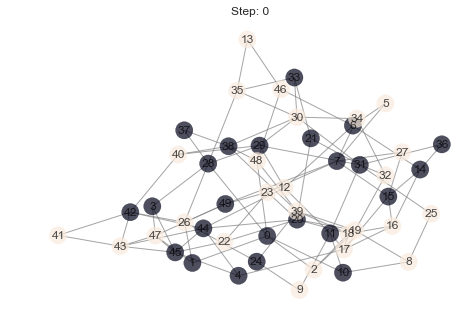

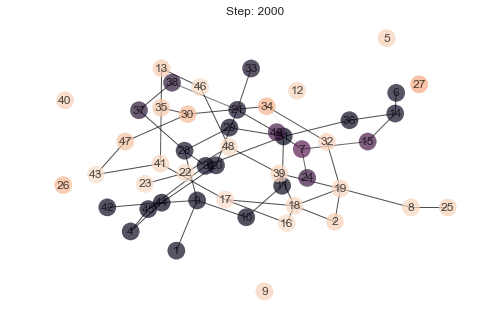

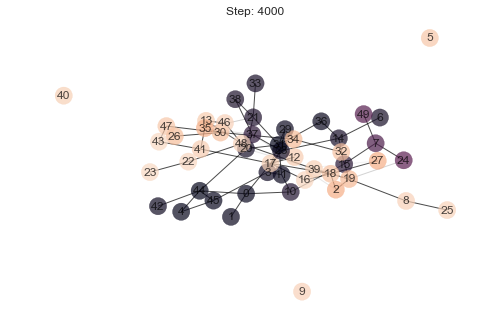

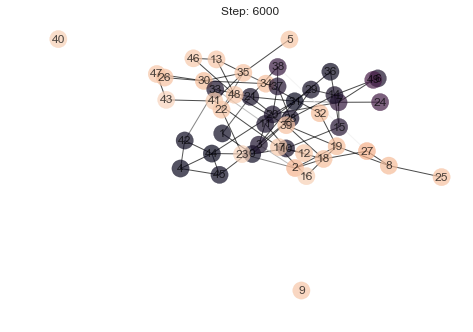

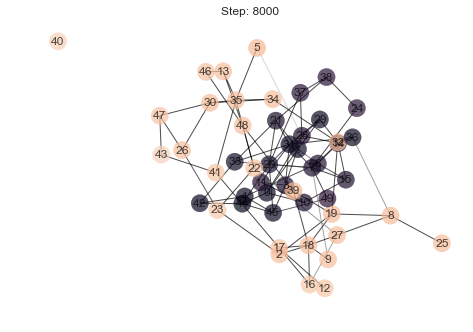

...

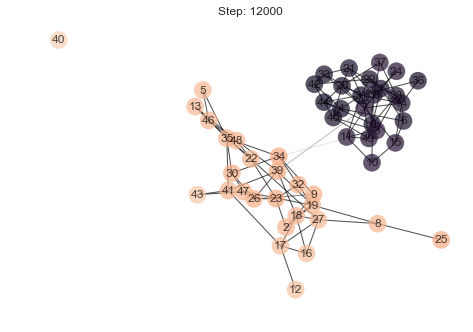

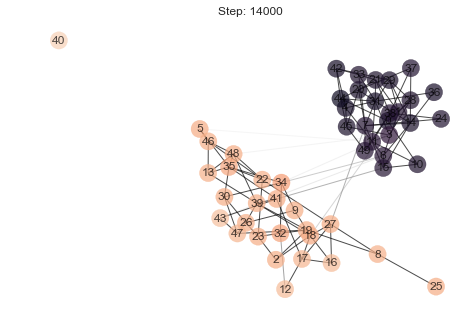

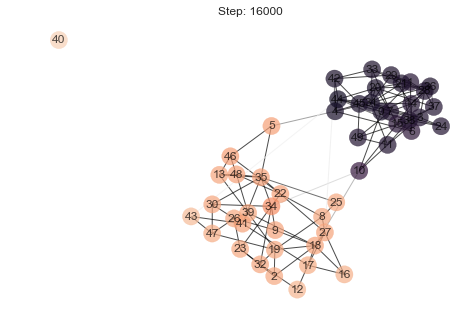

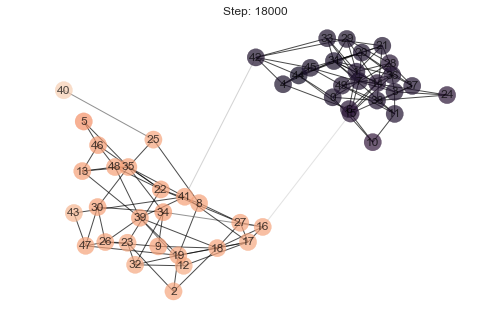

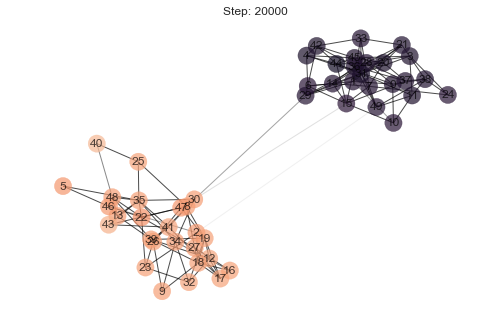

In [10]:
default_model = SocialDynamicsMod(personal_params = True)

plot_network(default_model)

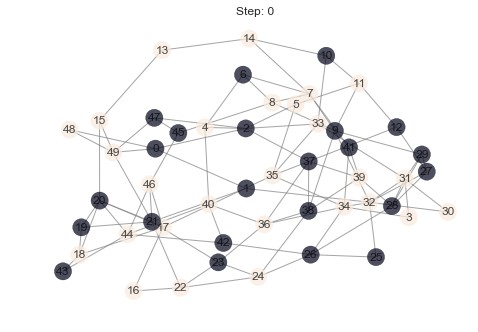

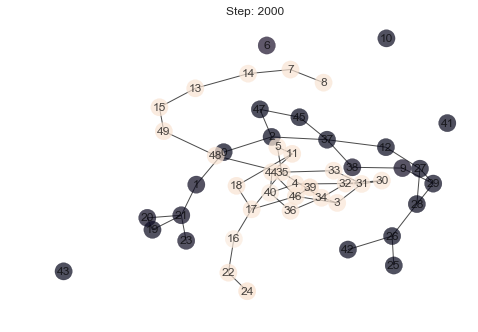

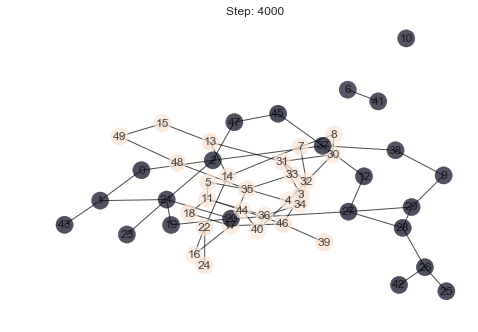

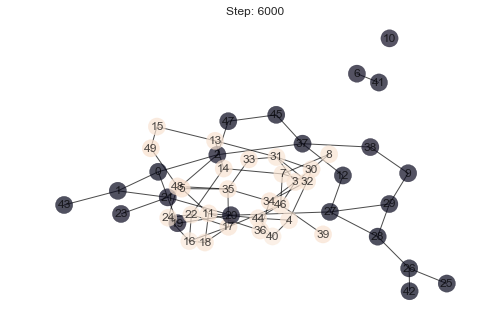

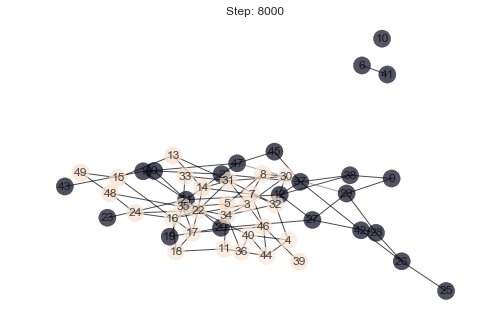

...

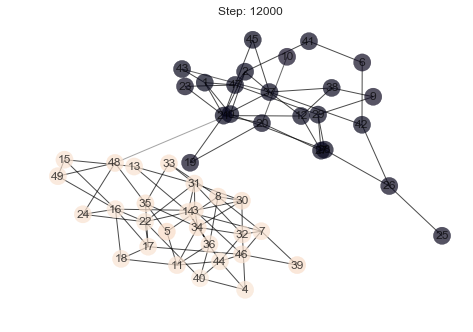

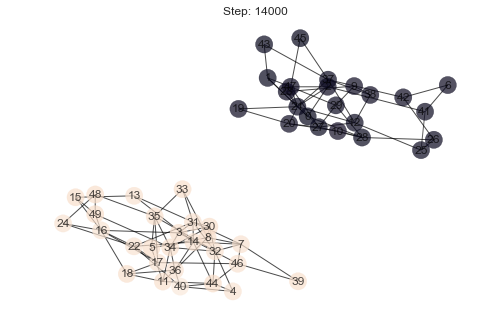

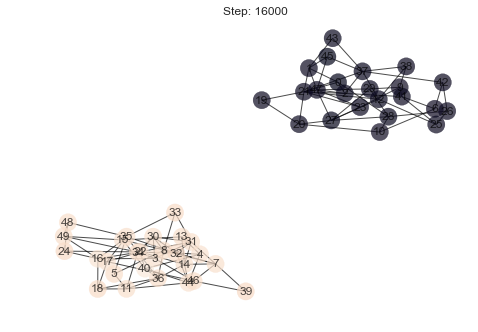

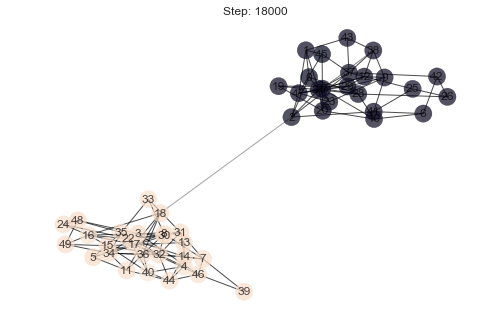

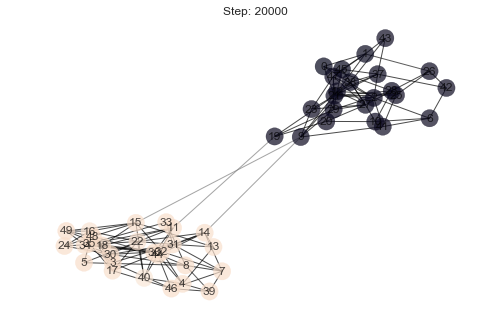

In [11]:
high_tension = SocialDynamicsMod(
                personal_params = True,
                alpha_mu = 0.01, alpha_sigma = 0.02,
                beta_mu = 0.8, beta_sigma = 0.2,
                gamma_mu = 8, gamma_sigma = 2,
                theta_mu = 1, theta_sigma = 0.2)

plot_network(high_tension)

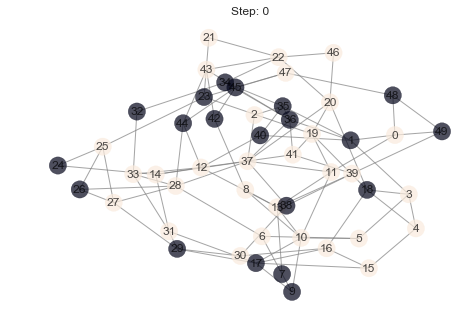

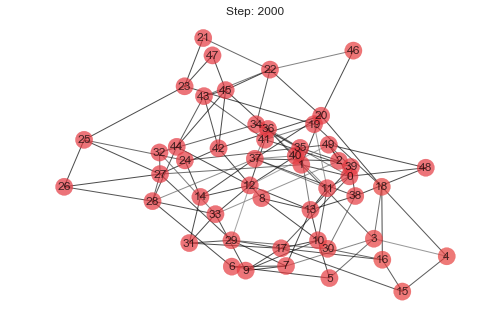

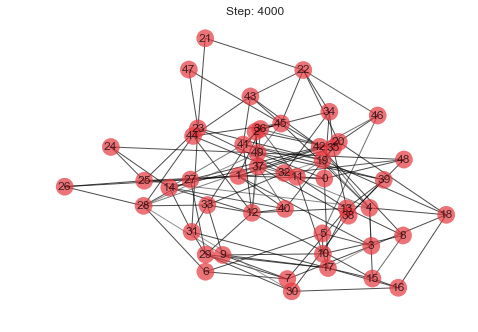

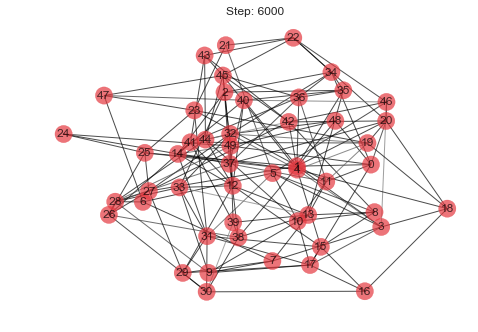

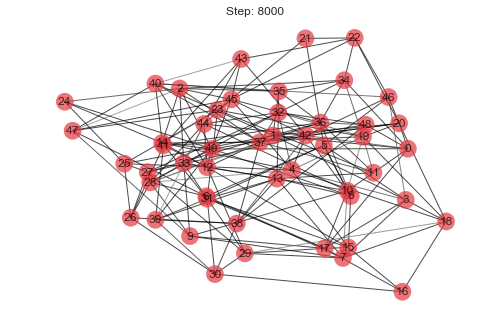

...

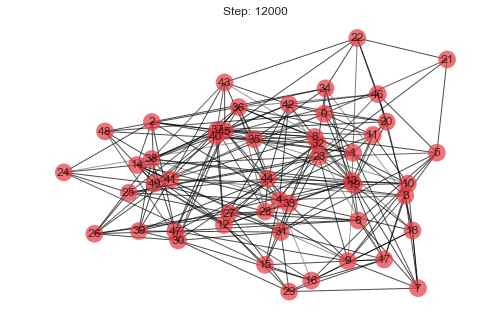

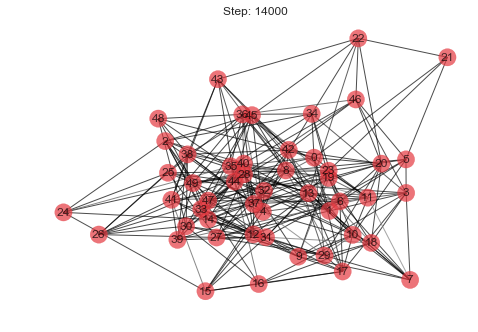

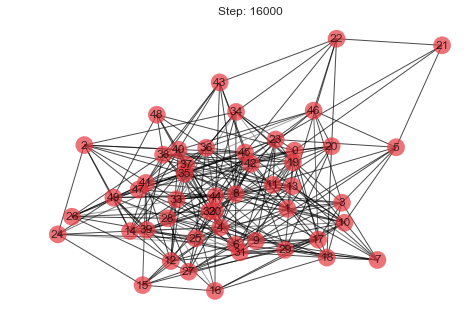

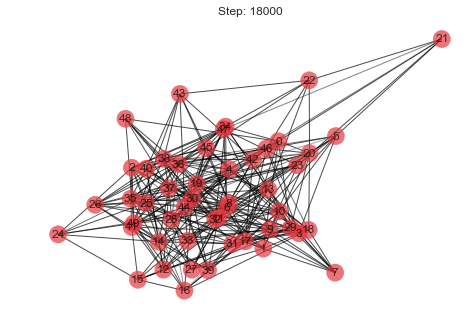

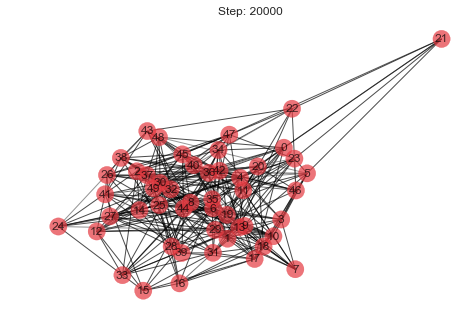

In [12]:
low_tension = SocialDynamicsMod(
                personal_params = True,
                alpha_mu = 0.4, alpha_sigma = 0.02,
                beta_mu = 0.2, beta_sigma = 0.2,
                gamma_mu = 2, gamma_sigma = 2,
                theta_mu = 1, theta_sigma = 0.2)

plot_network(low_tension)

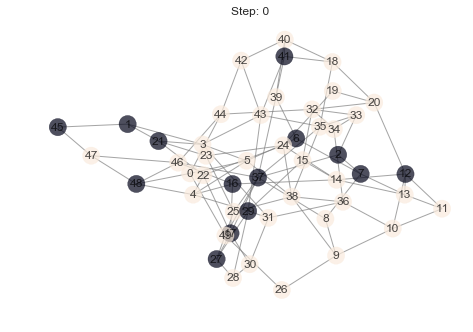

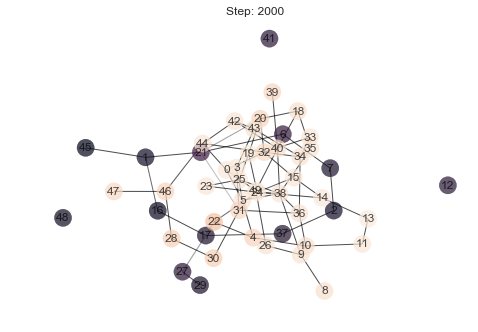

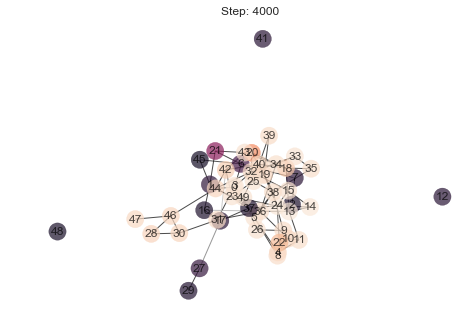

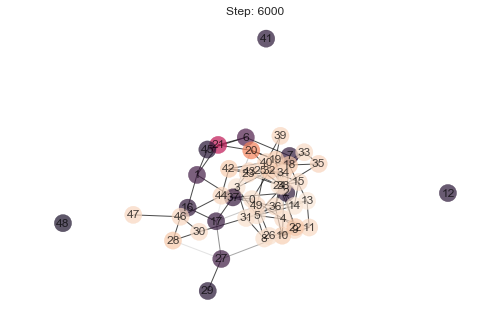

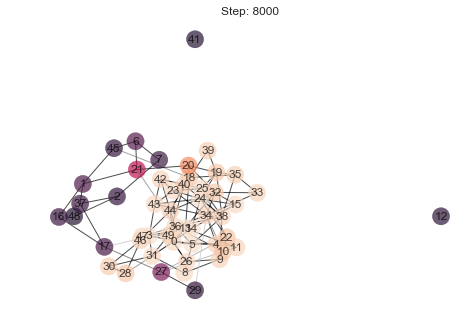

...

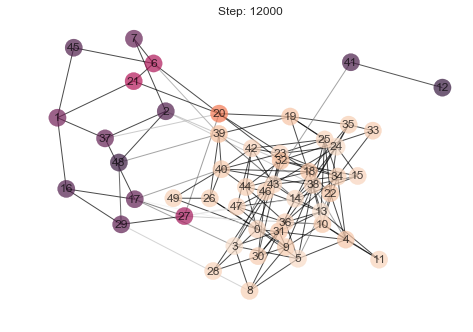

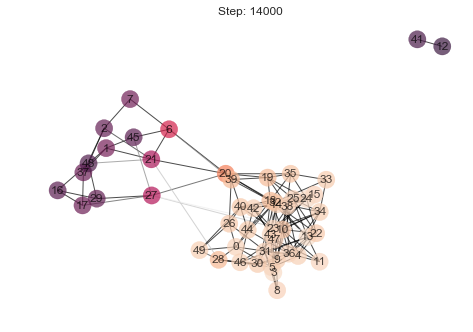

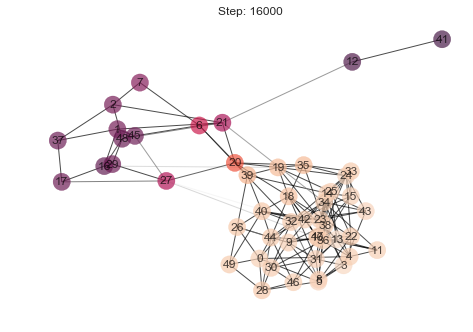

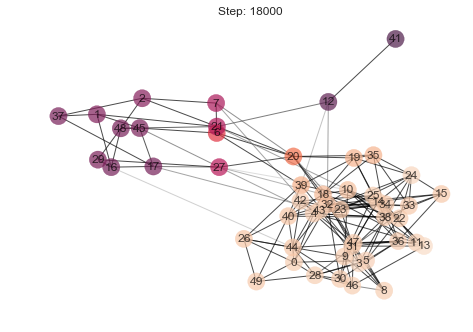

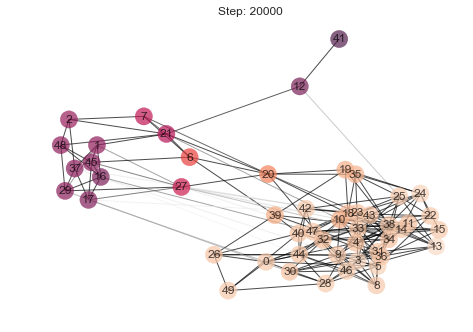

In [13]:
high_persuasion = SocialDynamicsMod(
                personal_params = True,
                theta_mu = 1.5, theta_sigma = 0.2)

plot_network(default_model)

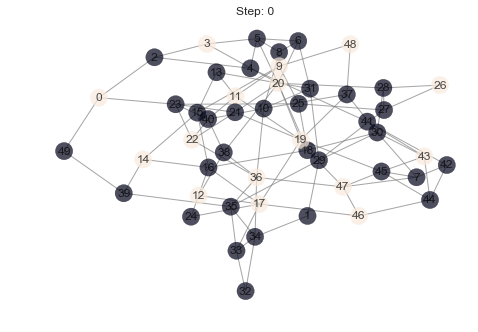

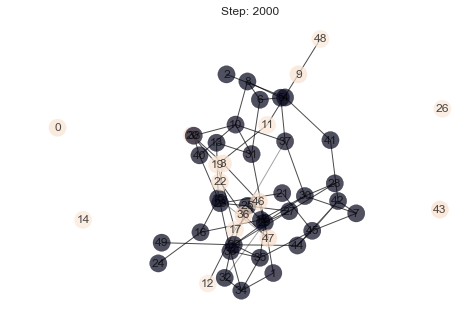

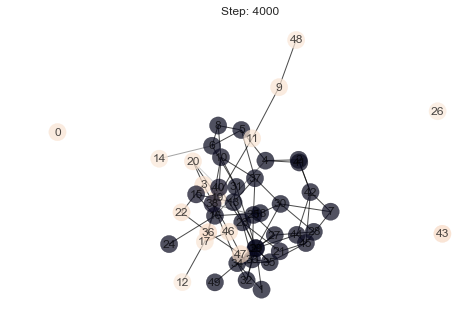

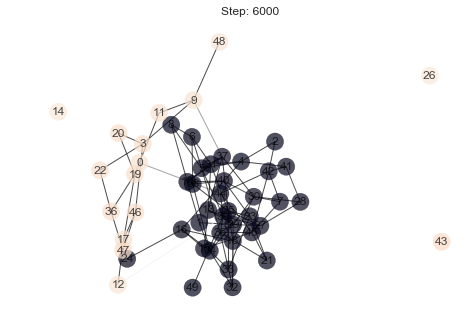

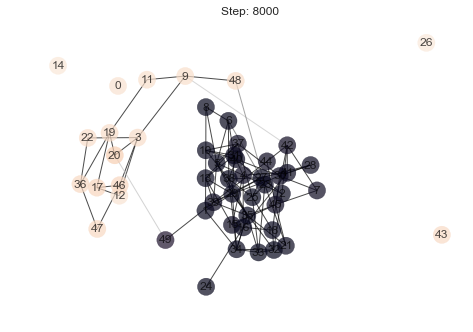

...

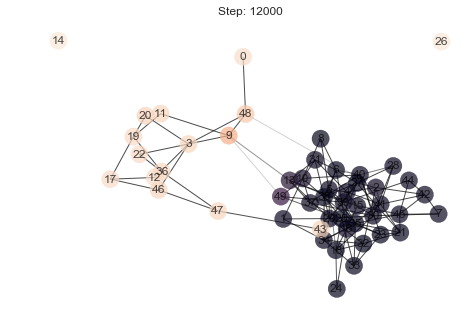

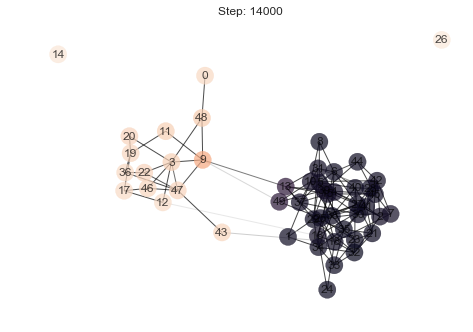

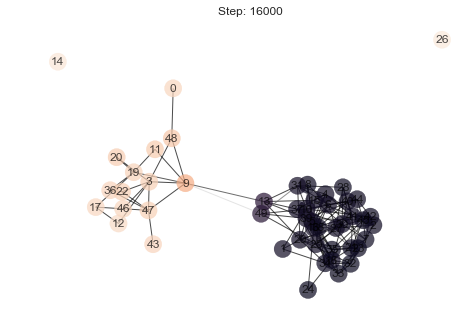

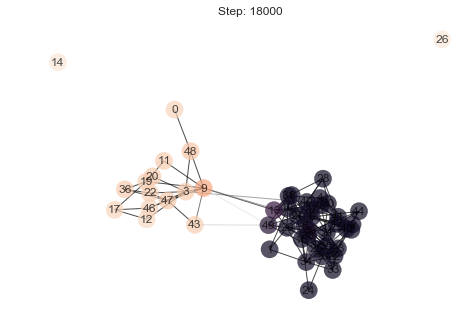

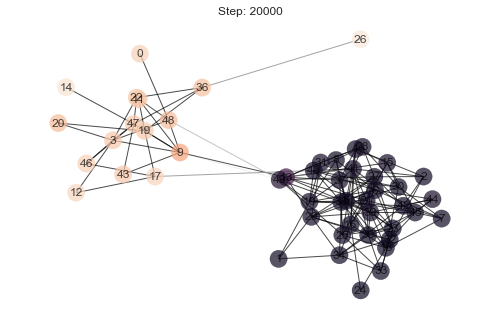

In [14]:
low_persuasion = SocialDynamicsMod(
                personal_params = True,
                theta_mu = 0.5, theta_sigma = 0.2)

plot_network(low_persuasion)

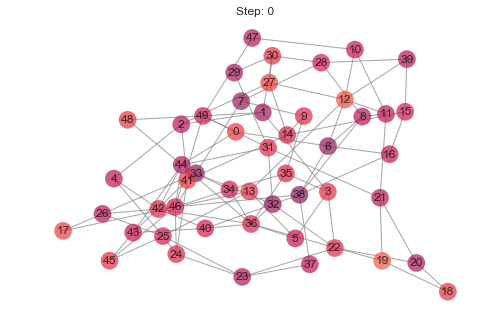

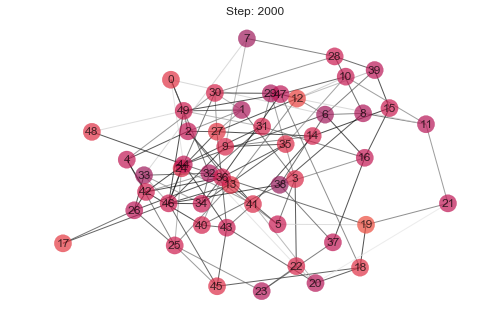

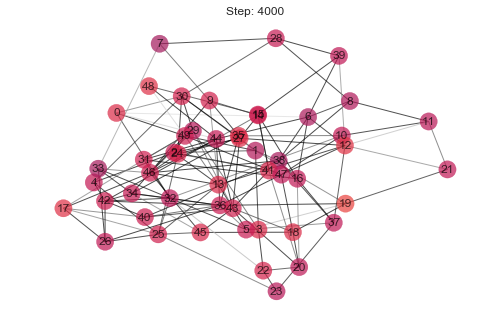

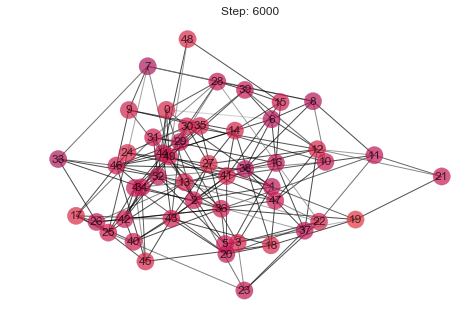

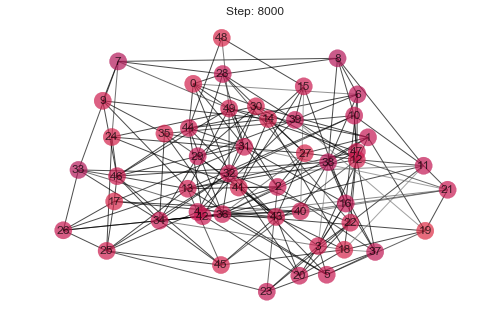

...

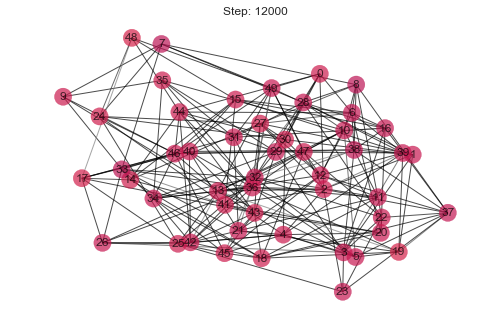

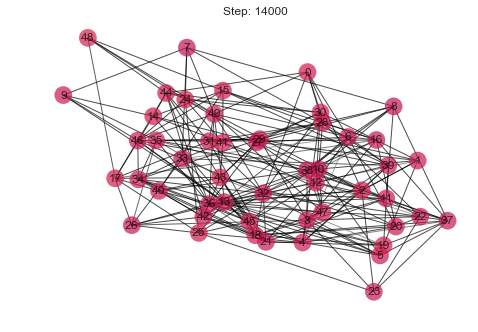

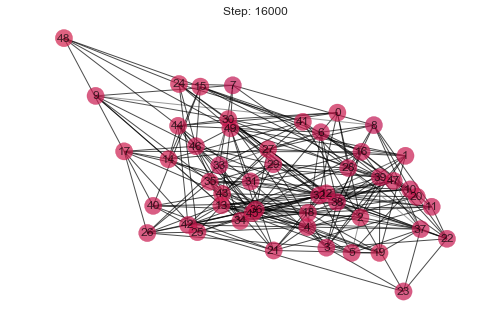

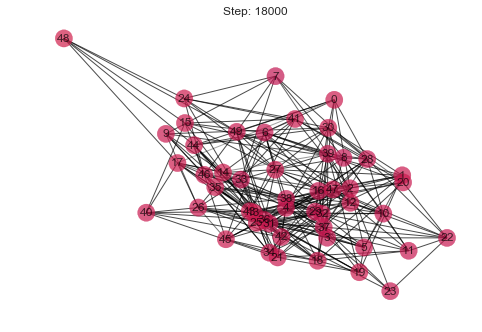

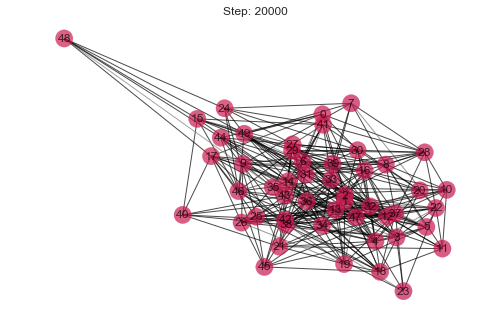

In [15]:
multiple_opinions = SocialDynamicsMod(multi_opinion = True)

plot_network(multiple_opinions)

<h2>Part 4: Simulation Analysis</h2>

<h3>Choice of Graph</h3>

In the simulations above, the Watts-Strogatz graph was chosen since it has small-world properties, i.e. there is a power-law distribution of number of edges per node since "hub" nodes with many connections tend to collect even more connections a la preferential attachment. The relationships we form in real life tend to exhibit small-world properties as well, and so the Watts-Strogatz graph is an appropriate choice for simulating the evolution of network dynamics as we would expect to see in the real world.

<h3>Simulation Results</h3>

The results for the simulation of the six scenarios are as follows:

<h4>Default model settings</h4>

The end result shows two separate clusters with differing opinions. The colors of the two clusters did undergo some visible changes, which suggests that despite the nodes breaking into two clusters, some opinion change did occur. 

The separation of clusters occurs around step 12000.

<h4>High-tension model</h4>

The end result shows two separate clusters with a stark color difference, suggesting that the nodes with differing opinions broke edges and also failed to change opinions of the other. The clustering also occurs rather quickly - around step 2000 - 4000.

<h4>Low-tension model</h4>

Around step 2000, the nodes have already intermingled to form one cohesive cluster with a shared opinion. The nodes become increasingly intermingled as time passes, and we see many more edges within the network at the end result.

<h4>High-persuasion default model</h4>

In the high-persuasion model, we see that the network is more durable, and only starts to break apart at around step 10,000. By that point, the nodes have interacted enough so that their opinions are less extreme. At the end of the simulation, the nodes have formed into two clusters as opposite ends (coral on one end and purple on the other), but are held together by some bridging nodes of moderating opinions. Furthermore, the nodes colors appear to have "bled" into each other, i.e. instead of two starkly different colors, we see a gradient from purple to coral in the resulting network.

This suggests that the introduction of high-persuasion nodes into a network is capable of bridging the network due to the minimizing of opinion difference at an earlier stage, resulting in slower edge breakage.

<h4>Low-persuasion default model</h4>

In the low-persuasion model, the nodes break into two different opinion clusters and the node colors are similar to the colors at the start of the simulation, which suggests that most of their opinions did not change. This is similar to the high-tension model.

<h4>Multiple opinions model</h4>

In the multiple opinions model, node colors represent the mean of opinions over multiple topics, so the model nodes already start out with a fairly average "mean" opinion, as represented by the pinkish color. Since the node opinions are sampled from a normal distribution, most nodes tend to have average opinions on topics, with maybe one or two extreme opinions. Since there is a higher probability of randomly choosing a topic in which both nodes have an average opinion, we see that the network grows more robust as time passes with more edges being formed while old edges are maintained. 

In a multi-topic network, there is less chance of edges completely breaking since a) most people have average opinions on a topic, and b) even if an extreme-opinion topic is chosen during one interaction, the subsequent interaction could be with an average-opinion topic, leading to relationship recovery. In a way, the model has an inbuilt "relationship recovery" system simply due to the higher odds of talking about a topic in which both nodes share a similar opinion.

<h3>Summary</h3>

As explained in part 2, the modifications added to the network simulation all help to make the model more similar to real life. While we might not observe much deviation by sampling the personalized parameters from normal distributions with means around the average expected parameter values, we would in fact expect to see most people have roughly similar attitudes that adhere to some normal distribution that represents the average behavior in real life. 

In the multi-topic network, we observe that the network is robust and does not break apart easily. This is most similar to what we observe in real life, as we often have opinions on multiple topics, and can share relationships and make new, strong connections with other people through similar interests, even if we differ in opinions regarding certain topics. To make this even more realistic, we could assign:

a) different probabilities for the topic to be chosen in the interaction

- Some topics come up more regularly in conversation than others. For example, our opinions on friends and family, tv shows, our inclination towards going outdoors vs staying indoors, etc. will be more commonly brought up vs obscure topics such as how we feel about cilantro as a garnish.

b) different weights for different topics

- Some topics may carry more significance than others, and hold more power to make or break a relationship. For example, a difference in political or racial views may lead to bigger fall out vs a difference in food preference. By assigning different weights, we can reflect the boost or decrease in edge weight as according to the importance of different topics.

By adding more complexity to the model, we could technically make the model more similar to real life, but this might also take away the appeal of the model as a simple simulation that can represent the complexity of real life without trying to include all the minute details. A careful consideration has to be made regarding the use-case of the model before additional modifications are added for the sake of making the model more "realistic".